In [8]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn import preprocessing

## Average annual domestic gas bills for GB regions with average unit costs based on consumption of 13,600kWh/year, since 2018 [Source: Average annual domestic gas bills for GB regions (QEP 2.3.3)](https://www.gov.uk/government/statistical-data-sets/annual-domestic-energy-price-statistics)

- United Kingdom
- Bills in this release are now calculated assuming an annual consumption of 13,600 kWh.
- Bills and unit costs reflect the prices of all suppliers and include standing charges. Figures are inclusive of VAT. 
- Bills relate to calendar year, i.e. Covering consumption from Q1 to Q4 of the named year.
- Unit costs are calculated by dividing the bills shown by the relevant consumption levels. 
- An 'r' next to a value indicates it has been revised. An 'r' in the United Kingdom row indicates that all data for that quarter has been revised.
- p's in year column indicate provisional data.
- Freeze panes are turned on. To turn off freeze panes select the 'View' ribbon then 'Freeze Panes' then 'Unfreeze Panes' or use [Alt,W,F]
- Source: Department for Business, Energy and Industrial Strategy (BEIS)

In [9]:
gas = pd.read_csv('UKGasHist.csv')
gas.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds)
0,2018,East Midlands,4.320564,648.084601,3.780164,567.024618,3.759168,563.875217,3.873593,581.038976
1,2018,Eastern,4.393549,659.032290,3.848033,577.204941,3.801151,570.172679,3.947257,592.088515
2,2018,London,4.492729,673.909331,4.044522,606.678342,3.914210,587.131438,4.141794,621.269041
3,2018,Merseyside & North Wales,4.373080,655.961927,3.887291,583.093723,3.816874,572.531077,3.956167,593.425092
4,2018,North East,4.267437,640.115592,3.728942,559.341373,3.722145,558.321794,3.816437,572.465617


## Average annual domestic standard electricity bills in for UK regions with average unit costs based on consumption of 3,600kWh/year since 2017 [Source: Average annual domestic electricity bills for UK regions (QEP 2.2.3)](https://www.gov.uk/government/statistical-data-sets/annual-domestic-energy-price-statistics)

- United Kingdom
- Bills in this release are now calculated assuming an annual consumption of 3,600 kWh.
- Bills and unit costs reflect the prices of all suppliers and include standing charges. Figures are inclusive of VAT. 
- Bills relate to calendar year, i.e. Covering consumption from Q1 to Q4 of the named year.
- Unit costs are calculated by dividing the bills shown by the relevant consumption levels. 
- An 'r' next to a value indicates it has been revised. An 'r' in the United Kingdom row indicates that all data for that quarter has been revised.
- p's in year column indicate provisional data.
- Freeze panes are turned on. To turn off freeze panes select the 'View' ribbon then 'Freeze Panes' then 'Unfreeze Panes' or use [Alt,W,F]
- Source: Department for Business, Energy and Industrial Strategy (BEIS)


In [10]:
electric = pd.read_csv('UKElectricHist.csv')
electric.head()

,Year,Region,Credit: Unit cost (Pence per kWh),Credit: Bill (Pounds),Direct debit: Unit cost (Pence per kWh),Direct debit: Bill (Pounds),Prepayment: Unit cost (Pence per kWh),Prepayment: Bill (Pounds),Overall: Unit cost (Pence per kWh),Overall: Bill (Pounds)
0,2017,East Midlands,17.267992,621.647710,15.473803,557.056904,16.180931,582.513515,15.974607,575.085865
1,2017,Eastern,17.517021,630.612740,15.646116,563.260177,16.368127,589.252568,16.179813,582.473264
2,2017,London,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411
3,2017,Merseyside & North Wales,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226
4,2017,North East,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109


## Total household expenditure on energy, United Kingdom [Source: Total household expenditure on energy in the UK (QEP 2.6.1)](https://www.gov.uk/government/statistical-data-sets/annual-domestic-energy-price-statistics)

- Figures in current prices
- These figures are based on Consumer Trends, as published by the Office for National Statistics.
- All data may be subject to change by ONS.
- Note 1. Liquid fuels includes fuel oils and heating oils.
- Freeze panes are turned on. To turn off freeze panes select the 'View' ribbon then 'Freeze Panes' then 'Unfreeze Panes' or use [Alt,W,F]
- Source: Office for National Statistics

In [11]:
tot_spend = pd.read_csv('TotalEnergySpendUK.csv')
tot_spend.tail()

,Year,Solid Fuels (£ million),Gas (£ million),Electricity (£ million),Liquid Fuels (£ million)[Note 1],All fuel and power (£ million),Vehicle Fuels and Lubricants (£ million),Total energy products (£ million),Total consumers expenditure (£ million)
46,2016,326,14508,15924,833,31591,27923,59514,1248091
47,2017,324,12906,16048,1073,30351,31203,61554,1287278
48,2018,370,14101,17230,1366,33067,34786,67853,1335216
49,2019,354,13943,18201,1292,33790,34275,68065,1367861
50,2020,371,12065,18422,926,31784,25996,57780,1231580


## Combine Gas and Electric Data

Add extra column that categorises if data is gas or electric

In [12]:
Energy_type_gas = ['G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G','G']

gas['Energy'] = Energy_type_gas

gas.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
0,2018,East Midlands,4.320564,648.084601,3.780164,567.024618,3.759168,563.875217,3.873593,581.038976,G
1,2018,Eastern,4.393549,659.032290,3.848033,577.204941,3.801151,570.172679,3.947257,592.088515,G
2,2018,London,4.492729,673.909331,4.044522,606.678342,3.914210,587.131438,4.141794,621.269041,G
3,2018,Merseyside & North Wales,4.373080,655.961927,3.887291,583.093723,3.816874,572.531077,3.956167,593.425092,G
4,2018,North East,4.267437,640.115592,3.728942,559.341373,3.722145,558.321794,3.816437,572.465617,G


In [13]:
# Fix case-sensitive name inconsistencies between the two datasets
col_names = {"Credit: Unit cost (Pence per kWh)":"Credit: Unit Cost (pence per kWh)",
                "Credit: Bill (Pounds)":"Credit: Bill (pounds)",
                "Direct debit: Unit cost (Pence per kWh)":"Direct debit: Unit Cost (pence per kWh)",
                "Direct debit: Bill (Pounds)":"Direct debit: Bill (pounds)",
                "Prepayment: Unit cost (Pence per kWh)":"Prepayment: Unit Cost (pence per kWh)",
                "Prepayment: Bill (Pounds)":"Prepayment: Bill (pounds)",
                "Overall: Unit cost (Pence per kWh)":"Overall: Unit Cost (pence per kWh)",
                "Overall: Bill (Pounds)":"Overall: Bill (pounds)"}

electric = electric.rename(col_names, axis=1)
electric.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds)
0,2017,East Midlands,17.267992,621.647710,15.473803,557.056904,16.180931,582.513515,15.974607,575.085865
1,2017,Eastern,17.517021,630.612740,15.646116,563.260177,16.368127,589.252568,16.179813,582.473264
2,2017,London,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411
3,2017,Merseyside & North Wales,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226
4,2017,North East,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109


In [14]:
Energy_type_elec = ['E', 'E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E','E',]


electric['Energy'] = Energy_type_elec

electric.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
0,2017,East Midlands,17.267992,621.647710,15.473803,557.056904,16.180931,582.513515,15.974607,575.085865,E
1,2017,Eastern,17.517021,630.612740,15.646116,563.260177,16.368127,589.252568,16.179813,582.473264,E
2,2017,London,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411,E
3,2017,Merseyside & North Wales,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226,E
4,2017,North East,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109,E


In [15]:
# join datasets
energy = pd.concat([gas, electric])
energy.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
0,2018,East Midlands,4.320564,648.084601,3.780164,567.024618,3.759168,563.875217,3.873593,581.038976,G
1,2018,Eastern,4.393549,659.032290,3.848033,577.204941,3.801151,570.172679,3.947257,592.088515,G
2,2018,London,4.492729,673.909331,4.044522,606.678342,3.914210,587.131438,4.141794,621.269041,G
3,2018,Merseyside & North Wales,4.373080,655.961927,3.887291,583.093723,3.816874,572.531077,3.956167,593.425092,G
4,2018,North East,4.267437,640.115592,3.728942,559.341373,3.722145,558.321794,3.816437,572.465617,G


In [16]:
# sort data by year

energy = energy.sort_values('Year')
energy.head(20)

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
9,2017,South Scotland,17.541869,631.507300,15.713662,565.691828,16.334579,588.044833,16.208950,583.522207,E
2,2017,London,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411,E
3,2017,Merseyside & North Wales,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226,E
4,2017,North East,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109,E
5,2017,North Scotland,19.153609,689.529921,17.312432,623.247543,17.921463,645.172659,17.805641,641.003086,E
6,2017,North West,17.764936,639.537683,15.957073,574.454643,16.438363,591.781067,16.450145,592.205236,E
7,2017,Northern Ireland,14.692779,528.940055,14.415705,518.965381,14.408052,518.689874,14.468418,520.863053,E
8,2017,South East,18.154140,653.549032,16.318245,587.456807,16.783788,604.216386,16.762040,603.433439,E
10,2017,South Wales,18.589114,669.208101,16.792710,604.537566,17.162589,617.853192,17.245608,620.841880,E
11,2017,South West,19.057835,686.082044,17.179642,618.467104,17.617475,634.229115,17.633328,634.799810,E


In [17]:
# Label encode energy type

le = preprocessing.LabelEncoder()
energy['Energy'] = le.fit_transform(energy['Energy'])

energy.head(20)

# 0 = Electric, 1 = Gas

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
9,2017,South Scotland,17.541869,631.507300,15.713662,565.691828,16.334579,588.044833,16.208950,583.522207,0
2,2017,London,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411,0
3,2017,Merseyside & North Wales,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226,0
4,2017,North East,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109,0
5,2017,North Scotland,19.153609,689.529921,17.312432,623.247543,17.921463,645.172659,17.805641,641.003086,0
6,2017,North West,17.764936,639.537683,15.957073,574.454643,16.438363,591.781067,16.450145,592.205236,0
7,2017,Northern Ireland,14.692779,528.940055,14.415705,518.965381,14.408052,518.689874,14.468418,520.863053,0
8,2017,South East,18.154140,653.549032,16.318245,587.456807,16.783788,604.216386,16.762040,603.433439,0
10,2017,South Wales,18.589114,669.208101,16.792710,604.537566,17.162589,617.853192,17.245608,620.841880,0
11,2017,South West,19.057835,686.082044,17.179642,618.467104,17.617475,634.229115,17.633328,634.799810,0


In [18]:
# Label encode the region

le = preprocessing.LabelEncoder()
energy['Region'] = le.fit_transform(energy['Region'])

energy.head()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
9,2017,9,17.541869,631.507300,15.713662,565.691828,16.334579,588.044833,16.208950,583.522207,0
2,2017,2,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411,0
3,2017,3,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226,0
4,2017,4,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109,0
5,2017,5,19.153609,689.529921,17.312432,623.247543,17.921463,645.172659,17.805641,641.003086,0


|Region Code (label)| Region name|
|-------------------|------------|
|0| East Midlands|
|1| Eastern|
|2| London|
|3| Merseyside & North Wales|
|4| North East|
|5| North Scotland|
|6| North West|
|7| Northern Ireland|
|8| South East|
|9| South Scotland|
|10| South Wales|
|11| South West|
|12| Southern|
|13| United Kingdom|
|14| West Midlands|
|15| Yorkshire|


## Exploratory Analysis

In [19]:
energy.describe()

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
count,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
mean,2019.214286,7.514286,13.624980,693.484478,12.318626,624.601916,12.683155,643.335922,12.619206,640.027900,0.428571
std,1.323749,4.691161,7.997930,73.282108,7.274828,69.134447,7.503517,74.552943,7.444242,69.956310,0.496649
min,2017.000000,0.000000,4.267437,528.940055,3.720023,518.965381,3.722145,517.822408,3.816437,520.863053,0.000000
25%,2018.000000,3.000000,4.624926,640.585662,4.132534,570.759156,4.297193,583.505558,4.230052,583.919286,0.000000
50%,2019.000000,8.000000,17.879161,671.482283,15.976188,606.568821,16.536185,622.000000,16.465814,621.588101,0.000000
75%,2020.000000,12.000000,20.895917,752.253029,18.891304,680.086928,19.723137,710.032921,19.392161,698.117796,1.000000
max,2021.000000,15.000000,24.373469,877.444885,21.972424,791.007261,22.921777,825.183966,22.488151,809.573422,1.000000


In [13]:
# Create pandas profile report
#energy_profile = ProfileReport(energy, title="Energy Price Data Profiling Report", explorative=True)

In [14]:
# Generate HTML Profile Report 
#energy_profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


In [20]:
tot_spend.describe()

,Year,Solid Fuels (£ million),Gas (£ million),Electricity (£ million),Liquid Fuels (£ million)[Note 1],All fuel and power (£ million),Vehicle Fuels and Lubricants (£ million),Total energy products (£ million),Total consumers expenditure (£ million)
count,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,51.000000,5.100000e+01
mean,1995.000000,515.392157,6775.019608,8101.176471,650.803922,16042.392157,15868.196078,31910.588235,5.842298e+05
std,14.866069,214.626660,4900.334105,5239.128400,461.097735,10389.282378,11374.213949,21601.725553,4.238876e+05
min,1970.000000,239.000000,387.000000,656.000000,74.000000,1494.000000,859.000000,2353.000000,3.054100e+04
25%,1982.500000,330.000000,3356.500000,4357.000000,348.500000,9033.000000,6601.500000,15634.500000,1.701275e+05
50%,1995.000000,488.000000,5781.000000,7519.000000,451.000000,14401.000000,13356.000000,28312.000000,5.317200e+05
75%,2007.500000,655.000000,11458.500000,12852.500000,952.500000,26229.500000,26260.000000,53073.500000,9.553295e+05
max,2020.000000,1047.000000,16683.000000,18422.000000,1679.000000,34817.000000,35346.000000,68626.000000,1.367861e+06


In [16]:
# Create pandas profile report
#expend_profile = ProfileReport(tot_spend, title="UK Energy expenditure Data Profiling Report", explorative=True)

In [17]:
# Generate HTML Profile Report 
#expend_profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


## Using the Electricity Costs API

Source: https://electricitycosts.org.uk/api/

|DNO| Region|
|---|-------|
|10 | Eastern England|
|11 | East Midlands|
|12 | London|
|13 | North Wales & Mersey|
|14 | Midlands|
|15 | North East|
|16 | North West|
|17 | Northern Scotland|
|18 | Southern Scotland|
|19 | South East|
|20 | Southern|
|21 | South Wales|
|22 | South Western|
|23 | Yorkshire|

In [21]:
# Make an example request to the Electricity Costs API, source: https://electricitycosts.org.uk/api-documentation/

import requests

# headers = {'Accept': 'application/json'}

# r = requests.get('https://odegdcpnma.execute-api.eu-west-2.amazonaws.com/development/prices?dno=10&voltage=HV&start=01-06-2021&end=03-06-2021', params={}, headers = headers)

# print(r.json())



In [19]:
# Convert the example API data to pandas DataFrame

# prices = pd.DataFrame(r.json()["data"]["data"])[['Overall', 'unixTimestamp', 'Timestamp']]
# prices.head()

,Overall,unixTimestamp,Timestamp
0,10.99,1622505600,00:00 01-06-2021
1,10.99,1622507400,00:30 01-06-2021
2,10.99,1622509200,01:00 01-06-2021
3,10.99,1622511000,01:30 01-06-2021
4,10.99,1622512800,02:00 01-06-2021


## Create PostgreSQL Database
See [here](https://www.postgresqltutorial.com/postgresql-python/connect/) for online tutorial.

In [20]:
# Make a connection function

# import psycopg2
# from config import config

# def connect():
#     """ Connect to the PostgreSQL database server """
#     conn = None
#     try:
#         # read connection parameters
#         params = config()

#         # connect to the PostgreSQL server
#         print('Connecting to the PostgreSQL database...')
#         conn = psycopg2.connect(**params)
		
#         # create a cursor
#         cur = conn.cursor()
        
# 	# execute a statement
#         print('PostgreSQL database version:')
#         cur.execute('SELECT version()')

#         # display the PostgreSQL database server version
#         db_version = cur.fetchone()
#         print(db_version)
       
# 	# close the communication with the PostgreSQL
#         cur.close()
#     except (Exception, psycopg2.DatabaseError) as error:
#         print(error)
#     finally:
#         if conn is not None:
#             conn.close()
#             print('Database connection closed.')


# if __name__ == '__main__':
#     connect()

Connecting to the PostgreSQL database...
PostgreSQL database version:
('PostgreSQL 12.9 on x86_64-pc-linux-gnu, compiled by gcc (GCC) 7.3.1 20180712 (Red Hat 7.3.1-12), 64-bit',)
Database connection closed.


In [21]:
# add example dataframe to postgresql as table source: https://www.geeksforgeeks.org/how-to-insert-a-pandas-dataframe-to-an-existing-postgresql-table/
import psycopg2.extras as extras  
  
# def execute_values(conn, df, table):
  
#     tuples = [tuple(x) for x in df.to_numpy()]  
#     cols = ','.join(list(df.columns))

#     # SQL query to execute
#     query = "INSERT INTO %s(%s) VALUES %%s" % (table, cols)
#     cursor = conn.cursor()
#     try:
#         extras.execute_values(cursor, query, tuples)
#         conn.commit()
#     except (Exception, psycopg2.DatabaseError) as error:
#         print("Error: %s" % error)
#         conn.rollback()
#         cursor.close()
#         return 1
#     print("the dataframe is inserted")
#     cursor.close()
  
# params = config()  
# conn = psycopg2.connect(**params)

# df = prices
  
# execute_values(conn, df, 'example_electricity_prices')

the dataframe is inserted


The Dataframe has been inserted into Postgresql as a table in the correct database (note: overall was saved as an int data type but should be decimal in future)  

![A screenshot of the example price data in Postgresql database table](DBexample_screenshot.png)

## Making larger API calls

Electricity Costs API Documentation Notes, source: https://electricitycosts.org.uk/api-documentation/

**Base URL**  

Request base URL: https://odegdcpnma.execute-api.eu-west-2.amazonaws.com/development/prices?{DNO}&{voltage}&{start}&{end}

**Request Parameters**  

DNO: Used to select the DNO region, the parameter should be added as a string in the format “dno=XX”, where XX is an integer from 10 to 23.  

Voltage: Used to select the voltage level, the parameter should be added as a string in the format “voltage=XX”, where XX can be “HV”, “LV” or “LV-Sub”. It is important to add these letter exactly as presented for the API request to work correctly.  

Start: Used to define the start date, the parameter should be added as a string in the format “start=DD-MM-YYYY”. It is important to add the “-” in-between the numbers.  

End: Used to define the end date, the parameter should be added as a string in the format “end=DD-MM-YYYY”. It is important to add the “-” in-between the numbers.

**NB:** A maximum of 31 days of data can be downloaded at a time using the download button. The data is retrieved in UTC time in the format YYYY-MM-DD and returned as a CSV file.

In [22]:
# API test 

import time

# headers = {'Accept': 'application/json'}

# url = 'https://odegdcpnma.execute-api.eu-west-2.amazonaws.com/development/prices?dno=10&voltage=HV&start=14-02-2022&end=14-03-2022'

# raw_price_data = requests.get(url, params={}, headers = headers).json()


# feb_march_prices10 = pd.DataFrame(raw_price_data["data"]["data"])[['Overall', 'unixTimestamp', 'Timestamp']]
# feb_march_prices10.head()




## Initial API Success and Data Collection Design Notes: https://electricitycosts.org.uk/

- The API only gives prices are for non-domestic users (businesses)
- Non-domestic electricity costs will be compared with domestic prices discovered in previous exploratory analysis.
- Prices are given in pence per kilowatt hour (p/kWh) 
- Each API call can get data for one region for 1 month >> 12 calls = 1 year of price data for one region >> 14 regions means 168 API calls for 1 year data for all regions
- 168 is a lot of API calls, it may be better to define a function that contains multiple calls and another that makes dataframes.
- Since "most SMEs are connected to LV levels" LV will be used for the voltage level for each API call.
- The peak price period is usually the hours of the day when the national electricity system demand is highest. In the UK, this time period is usually between 4 pm to 7 pm.


## Make the API calls

In [23]:
# Make the API call function

#'https://odegdcpnma.execute-api.eu-west-2.amazonaws.com/development/prices?dno=10&voltage=HV&start=14-02-2021&end=14-02-2022'

def APICaller(dno, voltage, start, end):   
    headers = {'Accept': 'application/json'}
    url = 'https://odegdcpnma.execute-api.eu-west-2.amazonaws.com/development/prices?'+'dno='+dno+'&voltage='+voltage+'&start='+start+'&end='+end
    url = str(url)
    raw_elec_price_data = requests.get(url, params={}, headers = headers).json()
    return raw_elec_price_data

# Call APICaller function for each region 

# 10 Eastern England
rd1 = APICaller('10', 'LV', '01-02-2022', '01-03-2022')  
rd2 = APICaller('10', 'LV', '01-03-2022', '01-04-2022')  
rd3 = APICaller('10', 'LV', '01-04-2022', '01-05-2022')  
rd4 = APICaller('10', 'LV', '01-05-2022', '01-06-2022') 
rd5 = APICaller('10', 'LV', '01-06-2022', '01-07-2022') #ok
rd6 = APICaller('10', 'LV', '01-07-2022', '01-08-2022') 
rd7 = APICaller('10', 'LV', '01-08-2022', '01-09-2022') 
rd8 = APICaller('10', 'LV', '01-09-2022', '01-10-2022')
rd9 = APICaller('10', 'LV', '01-10-2022', '01-11-2022')
rd10 = APICaller('10', 'LV', '01-11-2022', '01-12-2022')
rd11 = APICaller('10', 'LV', '01-12-2022', '01-01-2023')
rd12 = APICaller('10', 'LV', '01-01-2023', '01-02-2023')

# 11 East Midlands
rd13 = APICaller('11', 'LV', '01-02-2022', '01-03-2022')  
rd14 = APICaller('11', 'LV', '01-03-2022', '01-04-2022')  
rd15 = APICaller('11', 'LV', '01-04-2022', '01-05-2022')  
rd16 = APICaller('11', 'LV', '01-05-2022', '01-06-2022') 
rd17 = APICaller('11', 'LV', '01-06-2022', '01-07-2022') 
rd18 = APICaller('11', 'LV', '01-07-2022', '01-08-2022') #ok
rd19 = APICaller('11', 'LV', '01-08-2022', '01-09-2022') 
rd20 = APICaller('11', 'LV', '01-09-2022', '01-10-2022')
rd21 = APICaller('11', 'LV', '01-10-2022', '01-11-2022')
rd22 = APICaller('11', 'LV', '01-11-2022', '01-12-2022')
rd23 = APICaller('11', 'LV', '01-12-2022', '01-01-2023')
rd24 = APICaller('11', 'LV', '01-01-2023', '01-02-2023')

# 12 London
rd25 = APICaller('12', 'LV', '01-02-2022', '01-03-2022')  
rd26 = APICaller('12', 'LV', '01-03-2022', '01-04-2022')  
rd27 = APICaller('12', 'LV', '01-04-2022', '01-05-2022')  
rd28 = APICaller('12', 'LV', '01-05-2022', '01-06-2022') 
rd29 = APICaller('12', 'LV', '01-06-2022', '01-07-2022') 
rd30 = APICaller('12', 'LV', '01-07-2022', '01-08-2022') #ok
rd31 = APICaller('12', 'LV', '01-08-2022', '01-09-2022') 
rd32 = APICaller('12', 'LV', '01-09-2022', '01-10-2022')
rd33 = APICaller('12', 'LV', '01-10-2022', '01-11-2022')
rd34 = APICaller('12', 'LV', '01-11-2022', '01-12-2022')
rd35 = APICaller('12', 'LV', '01-12-2022', '01-01-2023')
rd36 = APICaller('12', 'LV', '01-01-2023', '01-02-2023')

# 13 North Wales & Mersey
rd37 = APICaller('13', 'LV', '01-02-2022', '01-03-2022')  
rd38 = APICaller('13', 'LV', '01-03-2022', '01-04-2022')  
rd39 = APICaller('13', 'LV', '01-04-2022', '01-05-2022')  
rd40 = APICaller('13', 'LV', '01-05-2022', '01-06-2022') 
rd41 = APICaller('13', 'LV', '01-06-2022', '01-07-2022') 
rd42 = APICaller('13', 'LV', '01-07-2022', '01-08-2022') 
rd43 = APICaller('13', 'LV', '01-08-2022', '01-09-2022') #ok
rd44 = APICaller('13', 'LV', '01-09-2022', '01-10-2022') 
rd45 = APICaller('13', 'LV', '01-10-2022', '01-11-2022')
rd46 = APICaller('13', 'LV', '01-11-2022', '01-12-2022')
rd47 = APICaller('13', 'LV', '01-12-2022', '01-01-2023')
rd48 = APICaller('13', 'LV', '01-01-2023', '01-02-2023')


# 14 Midlands
rd49 = APICaller('14', 'LV', '01-02-2022', '01-03-2022')
rd50 = APICaller('14', 'LV', '01-03-2022', '01-04-2022')  
rd51 = APICaller('14', 'LV', '01-04-2022', '01-05-2022')  
rd52 = APICaller('14', 'LV', '01-05-2022', '01-06-2022')  
rd53 = APICaller('14', 'LV', '01-06-2022', '01-07-2022') 
rd54 = APICaller('14', 'LV', '01-07-2022', '01-08-2022') #ok
rd55 = APICaller('14', 'LV', '01-08-2022', '01-09-2022') 
rd56 = APICaller('14', 'LV', '01-09-2022', '01-10-2022') 
rd57 = APICaller('14', 'LV', '01-10-2022', '01-11-2022')
rd58 = APICaller('14', 'LV', '01-11-2022', '01-12-2022')
rd59 = APICaller('14', 'LV', '01-12-2022', '01-01-2023')
rd60 = APICaller('14', 'LV', '01-01-2023', '01-02-2023')


# 15 North East
rd61 = APICaller('15', 'LV', '01-02-2022', '01-03-2022')
rd62 = APICaller('15', 'LV', '01-03-2022', '01-04-2022')  
rd63 = APICaller('15', 'LV', '01-04-2022', '01-05-2022')  
rd64 = APICaller('15', 'LV', '01-05-2022', '01-06-2022')  
rd65 = APICaller('15', 'LV', '01-06-2022', '01-07-2022') 
rd66 = APICaller('15', 'LV', '01-07-2022', '01-08-2022') 
rd67 = APICaller('15', 'LV', '01-08-2022', '01-09-2022') #ok
rd68 = APICaller('15', 'LV', '01-09-2022', '01-10-2022') 
rd69 = APICaller('15', 'LV', '01-10-2022', '01-11-2022')
rd70 = APICaller('15', 'LV', '01-11-2022', '01-12-2022')
rd71 = APICaller('15', 'LV', '01-12-2022', '01-01-2023')
rd72 = APICaller('15', 'LV', '01-01-2023', '01-02-2023')


# 16 North West
rd73 = APICaller('16', 'LV', '01-02-2022', '01-03-2022')
rd74 = APICaller('16', 'LV', '01-03-2022', '01-04-2022')  
rd75 = APICaller('16', 'LV', '01-04-2022', '01-05-2022')  
rd76 = APICaller('16', 'LV', '01-05-2022', '01-06-2022')  
rd77 = APICaller('16', 'LV', '01-06-2022', '01-07-2022') 
rd78 = APICaller('16', 'LV', '01-07-2022', '01-08-2022') #ok
rd79 = APICaller('16', 'LV', '01-08-2022', '01-09-2022') 
rd80 = APICaller('16', 'LV', '01-09-2022', '01-10-2022') 
rd81 = APICaller('16', 'LV', '01-10-2022', '01-11-2022')
rd82 = APICaller('16', 'LV', '01-11-2022', '01-12-2022')
rd83 = APICaller('16', 'LV', '01-12-2022', '01-01-2023')
rd84 = APICaller('16', 'LV', '01-01-2023', '01-02-2023')


# 17 Northern Scotland
rd85 = APICaller('17', 'LV', '01-02-2022', '01-03-2022')
rd86 = APICaller('17', 'LV', '01-03-2022', '01-04-2022')  
rd87 = APICaller('17', 'LV', '01-04-2022', '01-05-2022')  
rd88 = APICaller('17', 'LV', '01-05-2022', '01-06-2022')  
rd89 = APICaller('17', 'LV', '01-06-2022', '01-07-2022') 
rd90 = APICaller('17', 'LV', '01-07-2022', '01-08-2022') 
rd91 = APICaller('17', 'LV', '01-08-2022', '01-09-2022') #ok
rd92 = APICaller('17', 'LV', '01-09-2022', '01-10-2022') 
rd93 = APICaller('17', 'LV', '01-10-2022', '01-11-2022')
rd94 = APICaller('17', 'LV', '01-11-2022', '01-12-2022')
rd95 = APICaller('17', 'LV', '01-12-2022', '01-01-2023')
rd96 = APICaller('17', 'LV', '01-01-2023', '01-02-2023')


# 18 Southern Scotland
rd97 = APICaller('18', 'LV', '01-02-2022', '01-03-2022')
rd98 = APICaller('18', 'LV', '01-03-2022', '01-04-2022')  
rd99 = APICaller('18', 'LV', '01-04-2022', '01-05-2022')  
rd100 = APICaller('18', 'LV', '01-05-2022', '01-06-2022')  
rd101 = APICaller('18', 'LV', '01-06-2022', '01-07-2022') 
rd102 = APICaller('18', 'LV', '01-07-2022', '01-08-2022') 
rd103 = APICaller('18', 'LV', '01-08-2022', '01-09-2022') 
rd104 = APICaller('18', 'LV', '01-09-2022', '01-10-2022') #ok
rd105 = APICaller('18', 'LV', '01-10-2022', '01-11-2022')
rd106 = APICaller('18', 'LV', '01-11-2022', '01-12-2022')
rd107 = APICaller('18', 'LV', '01-12-2022', '01-01-2023')
rd108 = APICaller('18', 'LV', '01-01-2023', '01-02-2023')


# 19 South East
rd109= APICaller('19', 'LV', '01-02-2022', '01-03-2022')
rd110= APICaller('19', 'LV', '01-03-2022', '01-04-2022')  
rd111= APICaller('19', 'LV', '01-04-2022', '01-05-2022')  
rd112= APICaller('19', 'LV', '01-05-2022', '01-06-2022')  
rd113= APICaller('19', 'LV', '01-06-2022', '01-07-2022') 
rd114= APICaller('19', 'LV', '01-07-2022', '01-08-2022') 
rd115= APICaller('19', 'LV', '01-08-2022', '01-09-2022') 
rd116= APICaller('19', 'LV', '01-09-2022', '01-10-2022') #ok
rd117= APICaller('19', 'LV', '01-10-2022', '01-11-2022')
rd118= APICaller('19', 'LV', '01-11-2022', '01-12-2022')
rd119= APICaller('19', 'LV', '01-12-2022', '01-01-2023')
rd120= APICaller('19', 'LV', '01-01-2023', '01-02-2023')


# 20 Southern
rd121= APICaller('20', 'LV', '01-02-2022', '01-03-2022')
rd122= APICaller('20', 'LV', '01-03-2022', '01-04-2022')  
rd123= APICaller('20', 'LV', '01-04-2022', '01-05-2022')  
rd124= APICaller('20', 'LV', '01-05-2022', '01-06-2022')  
rd125= APICaller('20', 'LV', '01-06-2022', '01-07-2022') 
rd126= APICaller('20', 'LV', '01-07-2022', '01-08-2022') 
rd127= APICaller('20', 'LV', '01-08-2022', '01-09-2022') #ok
rd128= APICaller('20', 'LV', '01-09-2022', '01-10-2022') 
rd129= APICaller('20', 'LV', '01-10-2022', '01-11-2022')
rd130= APICaller('20', 'LV', '01-11-2022', '01-12-2022')
rd131= APICaller('20', 'LV', '01-12-2022', '01-01-2023')
rd132= APICaller('20', 'LV', '01-01-2023', '01-02-2023')


# 21 South Wales
rd133= APICaller('21', 'LV', '01-02-2022', '01-03-2022')
rd134= APICaller('21', 'LV', '01-03-2022', '01-04-2022')  
rd135= APICaller('21', 'LV', '01-04-2022', '01-05-2022')  
rd136= APICaller('21', 'LV', '01-05-2022', '01-06-2022')  
rd137= APICaller('21', 'LV', '01-06-2022', '01-07-2022') 
rd138= APICaller('21', 'LV', '01-07-2022', '01-08-2022') 
rd139= APICaller('21', 'LV', '01-08-2022', '01-09-2022') #ok
rd140= APICaller('21', 'LV', '01-09-2022', '01-10-2022') 
rd141= APICaller('21', 'LV', '01-10-2022', '01-11-2022')
rd142= APICaller('21', 'LV', '01-11-2022', '01-12-2022')
rd143= APICaller('21', 'LV', '01-12-2022', '01-01-2023')
rd144= APICaller('21', 'LV', '01-01-2023', '01-02-2023')


# 22 South Western
rd145= APICaller('22', 'LV', '01-02-2022', '01-03-2022')
rd146= APICaller('22', 'LV', '01-03-2022', '01-04-2022')  
rd147= APICaller('22', 'LV', '01-04-2022', '01-05-2022')  
rd148= APICaller('22', 'LV', '01-05-2022', '01-06-2022')  
rd149= APICaller('22', 'LV', '01-06-2022', '01-07-2022') 
rd150= APICaller('22', 'LV', '01-07-2022', '01-08-2022') 
rd151= APICaller('22', 'LV', '01-08-2022', '01-09-2022') #ok
rd152= APICaller('22', 'LV', '01-09-2022', '01-10-2022') 
rd153= APICaller('22', 'LV', '01-10-2022', '01-11-2022')
rd154= APICaller('22', 'LV', '01-11-2022', '01-12-2022')
rd155= APICaller('22', 'LV', '01-12-2022', '01-01-2023')
rd156= APICaller('22', 'LV', '01-01-2023', '01-02-2023')


# 23 Yorkshire
rd157= APICaller('23', 'LV', '01-02-2022', '01-03-2022')
rd158= APICaller('23', 'LV', '01-03-2022', '01-04-2022')  
rd159= APICaller('23', 'LV', '01-04-2022', '01-05-2022')  
rd160= APICaller('23', 'LV', '01-05-2022', '01-06-2022')  
rd161= APICaller('23', 'LV', '01-06-2022', '01-07-2022') 
rd162= APICaller('23', 'LV', '01-07-2022', '01-08-2022') 
rd163= APICaller('23', 'LV', '01-08-2022', '01-09-2022') #ok
rd164= APICaller('23', 'LV', '01-09-2022', '01-10-2022') 
rd165= APICaller('23', 'LV', '01-10-2022', '01-11-2022')
rd166= APICaller('23', 'LV', '01-11-2022', '01-12-2022')
rd167= APICaller('23', 'LV', '01-12-2022', '01-01-2023')
rd168= APICaller('23', 'LV', '01-01-2023', '01-02-2023')


## Make the dataframes

In [24]:
# Make the dataframe builder function

def dataframeBuild(rawdata, regionDNO):    
    price_df = pd.DataFrame(rawdata["data"]["data"])[['Overall', 'unixTimestamp', 'Timestamp']]

    # insert the regionDNO code
    price_df.insert(0, 'regionDNO', regionDNO)

    # Drop times that are not in peak period of 4pm to 7pm (16:00 to 19:00)
    price_df = price_df[price_df['Timestamp'].str.contains('00:00|00:30|01:00|01:30|02:00|02:30|03:00|03:30|04:00|04:30|05:00|05:30|06:00|06:30|07:00|07:30|08:00|08:30|09:00|09:30|10:00|10:30|11:00|11:30|12:00|12:30|13:00|13:30|14:00|14:30|15:00|15:30|19:30|20:00|20:30|21:00|21:30|22:00|22:30|23:00|23:30')==False]
    
    # Add column containing mean value of Overall (p/kwh) for each raw data month
    value = price_df['Overall'].sum()/price_df['Overall'].count()
    price_df.insert(1, "monthlyMean", value)
    return price_df

In [25]:
d_test = dataframeBuild(rd1, 10)
d_test.tail()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
1330,10,21.262398,27.06,1646067600,17:00 28-02-2022
1331,10,21.262398,27.06,1646069400,17:30 28-02-2022
1332,10,21.262398,27.06,1646071200,18:00 28-02-2022
1333,10,21.262398,27.06,1646073000,18:30 28-02-2022
1334,10,21.262398,11.67,1646074800,19:00 28-02-2022


In [26]:
# Eastern England 

df10 = pd.concat([dataframeBuild(rd1, 10), dataframeBuild(rd2, 10),dataframeBuild(rd3, 10),dataframeBuild(rd4, 10),dataframeBuild(rd5, 10),dataframeBuild(rd6, 10),dataframeBuild(rd7, 10),dataframeBuild(rd8, 10),dataframeBuild(rd9, 10),dataframeBuild(rd10, 10),dataframeBuild(rd11, 10), dataframeBuild(rd12, 10)])

df10.head()


,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,10,21.262398,30.93,1643731200,16:00 01-02-2022
33,10,21.262398,30.93,1643733000,16:30 01-02-2022
34,10,21.262398,30.93,1643734800,17:00 01-02-2022
35,10,21.262398,30.93,1643736600,17:30 01-02-2022
36,10,21.262398,30.93,1643738400,18:00 01-02-2022


In [27]:
# East Midlands

df11 = pd.concat([dataframeBuild(rd13, 11), dataframeBuild(rd14, 11),dataframeBuild(rd15, 11),dataframeBuild(rd16, 11),dataframeBuild(rd17, 11),dataframeBuild(rd18, 11),dataframeBuild(rd19, 11),dataframeBuild(rd20, 11),dataframeBuild(rd21, 11),dataframeBuild(rd22, 11),dataframeBuild(rd23, 11), dataframeBuild(rd24, 11)])

df11.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,11,19.07199,26.87,1643731200,16:00 01-02-2022
33,11,19.07199,26.87,1643733000,16:30 01-02-2022
34,11,19.07199,26.87,1643734800,17:00 01-02-2022
35,11,19.07199,26.87,1643736600,17:30 01-02-2022
36,11,19.07199,26.87,1643738400,18:00 01-02-2022


In [28]:
# London
df12 = pd.concat([dataframeBuild(rd25, 12), dataframeBuild(rd26, 12),dataframeBuild(rd27, 12),dataframeBuild(rd28, 12),dataframeBuild(rd29, 12),dataframeBuild(rd30, 12),dataframeBuild(rd31, 12),dataframeBuild(rd32, 12),dataframeBuild(rd33, 12),dataframeBuild(rd34, 12),dataframeBuild(rd35, 12), dataframeBuild(rd36, 12)])

df12.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,12,17.721173,25.31,1643731200,16:00 01-02-2022
33,12,17.721173,25.31,1643733000,16:30 01-02-2022
34,12,17.721173,25.31,1643734800,17:00 01-02-2022
35,12,17.721173,25.31,1643736600,17:30 01-02-2022
36,12,17.721173,25.31,1643738400,18:00 01-02-2022


In [29]:
# North Wales & Mersey
df13 = pd.concat([dataframeBuild(rd37, 13), dataframeBuild(rd38, 13),dataframeBuild(rd39, 13),dataframeBuild(rd40, 13),dataframeBuild(rd41, 13),dataframeBuild(rd42, 13),dataframeBuild(rd43, 13),dataframeBuild(rd44, 13),dataframeBuild(rd45, 13),dataframeBuild(rd46, 13),dataframeBuild(rd4, 13), dataframeBuild(rd48, 13)])

df13.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,13,22.62551,23.81,1643731200,16:00 01-02-2022
33,13,22.62551,31.61,1643733000,16:30 01-02-2022
34,13,22.62551,31.61,1643734800,17:00 01-02-2022
35,13,22.62551,31.61,1643736600,17:30 01-02-2022
36,13,22.62551,31.61,1643738400,18:00 01-02-2022


In [30]:
# Midlands
df14 = pd.concat([dataframeBuild(rd49, 14), dataframeBuild(rd50, 14),dataframeBuild(rd51, 14),dataframeBuild(rd52, 14),dataframeBuild(rd53, 14),dataframeBuild(rd54, 14),dataframeBuild(rd55, 14),dataframeBuild(rd56, 14),dataframeBuild(rd57, 14),dataframeBuild(rd58, 14),dataframeBuild(rd59, 14), dataframeBuild(rd60, 14)])

df14.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,14,19.215867,26.97,1643731200,16:00 01-02-2022
33,14,19.215867,26.97,1643733000,16:30 01-02-2022
34,14,19.215867,26.97,1643734800,17:00 01-02-2022
35,14,19.215867,26.97,1643736600,17:30 01-02-2022
36,14,19.215867,26.97,1643738400,18:00 01-02-2022


In [31]:
# North East 
df15 = pd.concat([dataframeBuild(rd61, 15), dataframeBuild(rd62, 15),dataframeBuild(rd63, 15),dataframeBuild(rd64, 15),dataframeBuild(rd65, 15),dataframeBuild(rd66, 15),dataframeBuild(rd67, 15),dataframeBuild(rd68, 15),dataframeBuild(rd69, 15),dataframeBuild(rd70, 15),dataframeBuild(rd71, 15), dataframeBuild(rd72, 15)])

df15.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,15,20.289541,27.82,1643731200,16:00 01-02-2022
33,15,20.289541,27.82,1643733000,16:30 01-02-2022
34,15,20.289541,27.82,1643734800,17:00 01-02-2022
35,15,20.289541,27.82,1643736600,17:30 01-02-2022
36,15,20.289541,27.82,1643738400,18:00 01-02-2022


In [32]:
# North West 
df16 = pd.concat([dataframeBuild(rd73, 16), dataframeBuild(rd74, 16),dataframeBuild(rd75, 16),dataframeBuild(rd76, 16),dataframeBuild(rd77, 16),dataframeBuild(rd78, 16),dataframeBuild(rd79, 16),dataframeBuild(rd80, 16),dataframeBuild(rd81, 16),dataframeBuild(rd82, 16),dataframeBuild(rd83, 16), dataframeBuild(rd84, 16)])

df16.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,16,20.432194,28.83,1643731200,16:00 01-02-2022
33,16,20.432194,28.83,1643733000,16:30 01-02-2022
34,16,20.432194,28.83,1643734800,17:00 01-02-2022
35,16,20.432194,28.83,1643736600,17:30 01-02-2022
36,16,20.432194,28.83,1643738400,18:00 01-02-2022


In [33]:
# Northern Scotland
df17 = pd.concat([dataframeBuild(rd85, 17), dataframeBuild(rd86, 17),dataframeBuild(rd87, 17),dataframeBuild(rd88, 17),dataframeBuild(rd89, 17),dataframeBuild(rd90, 17),dataframeBuild(rd91, 17),dataframeBuild(rd92, 17),dataframeBuild(rd93, 17),dataframeBuild(rd94, 17),dataframeBuild(rd95, 17), dataframeBuild(rd96, 17)])

df17.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,17,21.647908,30.14,1643731200,16:00 01-02-2022
33,17,21.647908,30.14,1643733000,16:30 01-02-2022
34,17,21.647908,30.14,1643734800,17:00 01-02-2022
35,17,21.647908,30.14,1643736600,17:30 01-02-2022
36,17,21.647908,30.14,1643738400,18:00 01-02-2022


In [34]:
# Southern Scotland
df18 = pd.concat([dataframeBuild(rd97, 18), dataframeBuild(rd98, 18),dataframeBuild(rd99, 18),dataframeBuild(rd100, 18),dataframeBuild(rd101, 18),dataframeBuild(rd102, 18),dataframeBuild(rd103, 18),dataframeBuild(rd104, 18),dataframeBuild(rd105, 18),dataframeBuild(rd106, 18),dataframeBuild(rd107, 18), dataframeBuild(rd108, 18)])

df18.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,18,20.822857,22.88,1643731200,16:00 01-02-2022
33,18,20.822857,29.25,1643733000,16:30 01-02-2022
34,18,20.822857,29.25,1643734800,17:00 01-02-2022
35,18,20.822857,29.25,1643736600,17:30 01-02-2022
36,18,20.822857,29.25,1643738400,18:00 01-02-2022


In [35]:
# South East
df19 = pd.concat([dataframeBuild(rd109, 19), dataframeBuild(rd110, 19),dataframeBuild(rd111, 19),dataframeBuild(rd112, 19),dataframeBuild(rd113, 19),dataframeBuild(rd114, 19),dataframeBuild(rd115, 19),dataframeBuild(rd116, 19),dataframeBuild(rd117, 19),dataframeBuild(rd118, 19),dataframeBuild(rd119, 19), dataframeBuild(rd120, 19)])

df19.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,19,20.939388,30.16,1643731200,16:00 01-02-2022
33,19,20.939388,30.16,1643733000,16:30 01-02-2022
34,19,20.939388,30.16,1643734800,17:00 01-02-2022
35,19,20.939388,30.16,1643736600,17:30 01-02-2022
36,19,20.939388,30.16,1643738400,18:00 01-02-2022


In [36]:
# Southern
df20 = pd.concat([dataframeBuild(rd121, 20), dataframeBuild(rd122, 20),dataframeBuild(rd123, 20),dataframeBuild(rd124, 20),dataframeBuild(rd125, 20),dataframeBuild(rd126, 20),dataframeBuild(rd127, 20),dataframeBuild(rd128, 20),dataframeBuild(rd129, 20),dataframeBuild(rd130, 20),dataframeBuild(rd131, 20), dataframeBuild(rd132, 20)])

df20.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,20,19.69551,22.14,1643731200,16:00 01-02-2022
33,20,19.69551,27.88,1643733000,16:30 01-02-2022
34,20,19.69551,27.88,1643734800,17:00 01-02-2022
35,20,19.69551,27.88,1643736600,17:30 01-02-2022
36,20,19.69551,27.88,1643738400,18:00 01-02-2022


In [37]:
# South Wales
df21 = pd.concat([dataframeBuild(rd133, 21), dataframeBuild(rd134, 21),dataframeBuild(rd135, 21),dataframeBuild(rd136, 21),dataframeBuild(rd137, 21),dataframeBuild(rd138, 21),dataframeBuild(rd139, 21),dataframeBuild(rd140, 21),dataframeBuild(rd141, 21),dataframeBuild(rd142, 21),dataframeBuild(rd143, 21), dataframeBuild(rd144, 21)])

df21.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,21,19.974643,22.89,1643731200,16:00 01-02-2022
33,21,19.974643,22.89,1643733000,16:30 01-02-2022
34,21,19.974643,28.85,1643734800,17:00 01-02-2022
35,21,19.974643,28.85,1643736600,17:30 01-02-2022
36,21,19.974643,28.85,1643738400,18:00 01-02-2022


In [38]:
# South Western
df22 = pd.concat([dataframeBuild(rd145, 22), dataframeBuild(rd146, 22),dataframeBuild(rd147, 22),dataframeBuild(rd148, 22),dataframeBuild(rd149, 22),dataframeBuild(rd150, 22),dataframeBuild(rd151, 22),dataframeBuild(rd152, 22),dataframeBuild(rd153, 22),dataframeBuild(rd154, 22),dataframeBuild(rd155, 22), dataframeBuild(rd156, 22)])

df22.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,22,19.996071,22.80,1643731200,16:00 01-02-2022
33,22,19.996071,22.80,1643733000,16:30 01-02-2022
34,22,19.996071,30.57,1643734800,17:00 01-02-2022
35,22,19.996071,30.57,1643736600,17:30 01-02-2022
36,22,19.996071,30.57,1643738400,18:00 01-02-2022


In [39]:
# Yorkshire
df23 = pd.concat([dataframeBuild(rd157, 23), dataframeBuild(rd158, 23),dataframeBuild(rd159, 23),dataframeBuild(rd160, 23),dataframeBuild(rd161, 23),dataframeBuild(rd162, 23),dataframeBuild(rd163, 23),dataframeBuild(rd164, 23),dataframeBuild(rd165, 23),dataframeBuild(rd166, 23),dataframeBuild(rd167, 23), dataframeBuild(rd168, 23)])

df23.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,23,19.025255,26.11,1643731200,16:00 01-02-2022
33,23,19.025255,26.11,1643733000,16:30 01-02-2022
34,23,19.025255,26.11,1643734800,17:00 01-02-2022
35,23,19.025255,26.11,1643736600,17:30 01-02-2022
36,23,19.025255,26.11,1643738400,18:00 01-02-2022


## Join all the regional dataframes together

In [40]:
# Combine all the dataframes

prices_df = pd.concat([df10, df11, df12, df13, df14, df15, df16, df17, df18, df19, df20, df21, df22, df23])

prices_df.head()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,10,21.262398,30.93,1643731200,16:00 01-02-2022
33,10,21.262398,30.93,1643733000,16:30 01-02-2022
34,10,21.262398,30.93,1643734800,17:00 01-02-2022
35,10,21.262398,30.93,1643736600,17:30 01-02-2022
36,10,21.262398,30.93,1643738400,18:00 01-02-2022


In [41]:
prices_df.tail()

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
1474,23,15.708618,17.07,1675184400,17:00 31-01-2023
1475,23,15.708618,17.07,1675186200,17:30 31-01-2023
1476,23,15.708618,17.07,1675188000,18:00 31-01-2023
1477,23,15.708618,17.07,1675189800,18:30 31-01-2023
1478,23,15.708618,16.25,1675191600,19:00 31-01-2023


## Save the Raw Data as a csv file

In [42]:
# uncomment below code to run on your own machine
#prices_df.to_csv('ukElectricityPrices22_23.csv', index=False)

## Put raw data in a cloud hosted postgresql database

See here for a guide: https://www.geeksforgeeks.org/how-to-insert-a-pandas-dataframe-to-an-existing-postgresql-table/

In [47]:
# def execute_values(conn, df, table):
  
#     tuples = [tuple(x) for x in df.to_numpy()]  
#     cols = ','.join(list(df.columns))

#     # SQL query to execute
#     query = "INSERT INTO %s(%s) VALUES %%s" % (table, cols)
#     cursor = conn.cursor()
#     try:
#         extras.execute_values(cursor, query, tuples)
#         conn.commit()
#     except (Exception, psycopg2.DatabaseError) as error:
#         print("Error: %s" % error)
#         conn.rollback()
#         cursor.close()
#         return 1
#     print("the dataframe is inserted")
#     cursor.close()
  
# params = config()  
# conn = psycopg2.connect(**params)

# df = prices_df
  
# execute_values(conn, df, 'electricity_prices_22')

the dataframe is inserted


## Design the predictive models

- **Research Questions:**
    - How much will electricity cost an average UK household in 2023? (Estimate the electricity price given the year and the region)?
    - How accurate is the predictive model for household electricity prices?
    - How does this compare to corporate prices? 
    - What are the regional differences in the prices over time?
- **Model Consideration Notes**
    - plot corporate prices on line graph for 2022 to 2023
    - perform linear and logistic regression analysis on household dataset 
    - perform knn on household dataset
    - perform time series forecasting on household dataset (to find 2023 prices)
    - calculate accuracy of time series forecast model
    - opt: perform random forest household dataset
    - opt: perform xgboost household dataset
    - compare accuracy metric for each model
    - select model with best accuracy
    - use prices from best accuracy model to compare to 2023 corporte prices
    - plot price comparisons on line graph


## Preprocessing the Data

In [43]:
# Sort prices_df by unixtimestamp
prices_df = prices_df.sort_values('unixTimestamp')
prices_df

,regionDNO,monthlyMean,Overall,unixTimestamp,Timestamp
32,10,21.262398,30.93,1643731200,16:00 01-02-2022
32,21,19.974643,22.89,1643731200,16:00 01-02-2022
32,20,19.695510,22.14,1643731200,16:00 01-02-2022
32,13,22.625510,23.81,1643731200,16:00 01-02-2022
32,11,19.071990,26.87,1643731200,16:00 01-02-2022
...,...,...,...,...,...
1478,12,14.381382,11.44,1675191600,19:00 31-01-2023
1478,11,15.611613,12.72,1675191600,19:00 31-01-2023
1478,10,17.948018,11.73,1675191600,19:00 31-01-2023
1478,22,16.469539,12.96,1675191600,19:00 31-01-2023


In [42]:
energy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140 entries, 9 to 79
Data columns (total 11 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Year                                     140 non-null    int64  
 1   Region                                   140 non-null    int32  
 2   Credit: Unit Cost (pence per kWh)        140 non-null    float64
 3   Credit: Bill (pounds)                    140 non-null    float64
 4   Direct debit: Unit Cost (pence per kWh)  140 non-null    float64
 5   Direct debit: Bill (pounds)              140 non-null    float64
 6   Prepayment: Unit Cost (pence per kWh)    140 non-null    float64
 7   Prepayment: Bill (pounds)                140 non-null    float64
 8   Overall: Unit Cost (pence per kWh)       140 non-null    float64
 9   Overall: Bill (pounds)                   140 non-null    float64
 10  Energy                                   140 non-nu

In [44]:
energy

,Year,Region,Credit: Unit Cost (pence per kWh),Credit: Bill (pounds),Direct debit: Unit Cost (pence per kWh),Direct debit: Bill (pounds),Prepayment: Unit Cost (pence per kWh),Prepayment: Bill (pounds),Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
9,2017,9,17.541869,631.507300,15.713662,565.691828,16.334579,588.044833,16.208950,583.522207,0
2,2017,2,17.898733,644.354393,16.148497,581.345909,16.082467,578.968794,16.701734,601.262411,0
3,2017,3,18.903100,680.511582,16.906958,608.650483,17.438386,627.781909,17.419895,627.116226,0
4,2017,4,17.863041,643.069485,15.848023,570.528822,16.559057,596.126062,16.404920,590.577109,0
5,2017,5,19.153609,689.529921,17.312432,623.247543,17.921463,645.172659,17.805641,641.003086,0
...,...,...,...,...,...,...,...,...,...,...,...
57,2021,14,4.650702,632.495528,4.136811,562.606335,4.132413,562.008154,4.220577,573.998534,1
58,2021,15,4.535280,616.798104,4.033643,548.575504,3.944960,536.514626,4.098332,557.373100,1
59,2021,13,4.650837,632.513896,4.154512,565.013684,4.112770,559.336741,4.229430,575.202416,1
45,2021,0,4.522034,614.996587,4.022216,547.021371,4.010922,545.485342,4.096767,557.160342,1


In [47]:
# drop all columns except year, region, Overall: Unit Cost (pence per kWh), Overall: Bill (pounds), Energy

energy2 = energy.drop(columns=['Credit: Unit Cost (pence per kWh)', 'Credit: Bill (pounds)', 'Direct debit: Unit Cost (pence per kWh)', 'Direct debit: Bill (pounds)', 'Prepayment: Unit Cost (pence per kWh)', 'Prepayment: Bill (pounds)'])

energy2.head()



,Year,Region,Overall: Unit Cost (pence per kWh),Overall: Bill (pounds),Energy
9,2017,9,16.208950,583.522207,0
2,2017,2,16.701734,601.262411,0
3,2017,3,17.419895,627.116226,0
4,2017,4,16.404920,590.577109,0
5,2017,5,17.805641,641.003086,0


## Regression Models

**Ordinary least squares Linear Regression.**

LinearRegression fits a linear model with coefficients w = (w1, …, wp) to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

source: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html#sklearn.linear_model.LinearRegression

In [55]:
from sklearn.linear_model import LinearRegression

In [119]:
# both X1 and X2 will be tested against each y value

X1 = energy2.iloc[:, 0].values.reshape(-1, 1) # isolate year
X2 = energy2.iloc[:, 1].values.reshape(-1, 1) # isolate region
y1 = energy2.iloc[:, 2].values.reshape(-1, 1) # set variable of what we want to predict (overall: unit cost (pence per kWh))
y2 = energy2.iloc[:, 3].values.reshape(-1, 1) # set variable of what we want to predict (overall: bill (pounds))

In [69]:
linear_regressor = LinearRegression() #create linear regression object

linear_regressor.fit(X1, y1) 
Y1X1_pred = linear_regressor.predict(X1) #create prediction line for model

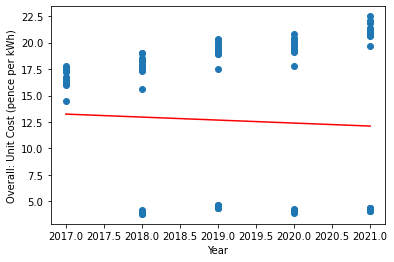

In [70]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X1, y1)
plt.plot(X1, Y1X1_pred, color='red')
plt.xlabel('Year')
plt.ylabel('Overall: Unit Cost (pence per kWh)')
plt.show()

The scatter plot above shows a vastly underfitted model for overall unit cost plotted against year.

In [71]:
linear_regressor.fit(X2, y1) 
Y1X2_pred = linear_regressor.predict(X2) #create prediction line for model

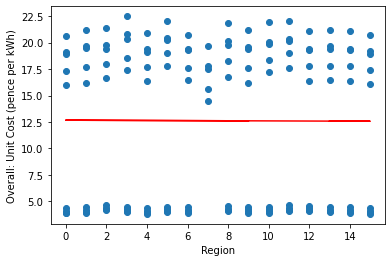

In [77]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X2, y1)
plt.plot(X2, Y1X2_pred, color='red')
plt.xlabel('Region')
plt.ylabel('Overall: Unit Cost (pence per kWh)')
plt.show()

The scatter plot above shows a vastly underfitted model for overall unit cost plotted against region.

In [73]:
linear_regressor.fit(X1, y2) 
Y2X1_pred = linear_regressor.predict(X1) #create prediction line for model

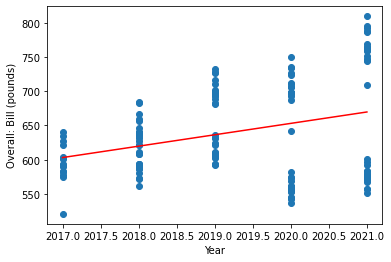

In [74]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X1, y2)
plt.plot(X1, Y2X1_pred, color='red')
plt.xlabel('Year')
plt.ylabel('Overall: Bill (pounds)')
plt.show()

The scatter plot above shows an underfitted model for overall bill plotted against year.

In [75]:
linear_regressor.fit(X2, y2) 
Y2X2_pred = linear_regressor.predict(X2) #create prediction line for model

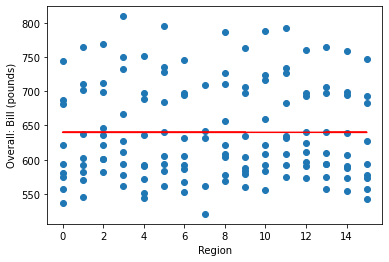

In [76]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X2, y2)
plt.plot(X2, Y2X2_pred, color='red')
plt.xlabel('Region')
plt.ylabel('Overall: Bill (pounds)')
plt.show()

The scatter plot above shows a vastly underfitted model for overall bill plotted against region.

*OLS Conclusion:* Ordinary Least Squares Regression is not an appropriate model for finding a trend in or predicting UK household energy prices. 

**Ridge Regression**

Linear least squares with l2 regularization. Minimizes the objective function: ||y - Xw||^2_2 + alpha * ||w||^2_2. This model solves a regression model where the loss function is the linear least squares function and regularization is given by the l2-norm. Also known as Ridge Regression or Tikhonov regularization. This estimator has built-in support for multi-variate regression (i.e., when y is a 2d-array of shape (n_samples, n_targets))

source: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html#sklearn.linear_model.Ridge

In [78]:
from sklearn import linear_model

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor

In [80]:
# train test split of overall unit cost vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=73)

In [81]:
# # define model
ridge_mod = linear_model.Ridge(alpha=.5)

# fit model
ridge_mod.fit(X_train, y_train)

# make prediction
ridge_pred1 = ridge_mod.predict(X_test)

# Calculate the mean squared error
rmse1 = mean_squared_error(y_test,ridge_pred1)**0.5
print(rmse1) # rmser = 7.377939663787684 when alpha is 0.05

7.377939663787684


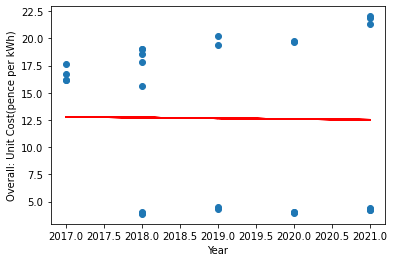

In [84]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X_test, y_test)
plt.plot(X_test, ridge_pred1, color='red')
plt.xlabel('Year')
plt.ylabel('Overall: Unit Cost(pence per kWh)')
plt.show()

In [85]:
# train test split of overall unit cost vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y1, test_size=0.2, random_state=2)

In [86]:
# # define model
ridge_mod = linear_model.Ridge(alpha=.5)

# fit model
ridge_mod.fit(X_train, y_train)

# make prediction
ridge_pred2 = ridge_mod.predict(X_test)

# Calculate the mean squared error
rmse2 = mean_squared_error(y_test,ridge_pred2)**0.5
print(rmse2) # rmser = 7.611233930453675 when alpha is 0.05

7.611233930453675


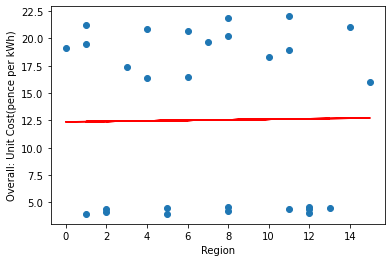

In [88]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X_test, y_test)
plt.plot(X_test, ridge_pred2, color='red')
plt.xlabel('Region')
plt.ylabel('Overall: Unit Cost(pence per kWh)')
plt.show()

In [89]:
# train test split of overall bill vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y2, test_size=0.2, random_state=9)

In [90]:
# # define model
ridge_mod = linear_model.Ridge(alpha=.5)

# fit model
ridge_mod.fit(X_train, y_train)

# make prediction
ridge_pred3 = ridge_mod.predict(X_test)

# Calculate the mean squared error
rmse3 = mean_squared_error(y_test,ridge_pred3)**0.5
print(rmse3) # rmser = 64.84354696916513 when alpha is 0.05

64.84354696916513


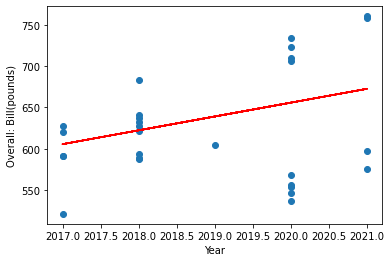

In [91]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X_test, y_test)
plt.plot(X_test, ridge_pred3, color='red')
plt.xlabel('Year')
plt.ylabel('Overall: Bill(pounds)')
plt.show()

In [92]:
# train test split of overall bill vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=84)

In [93]:
# # define model
ridge_mod = linear_model.Ridge(alpha=.5)

# fit model
ridge_mod.fit(X_train, y_train)

# make prediction
ridge_pred4 = ridge_mod.predict(X_test)

# Calculate the mean squared error
rmse4 = mean_squared_error(y_test,ridge_pred4)**0.5
print(rmse4) # rmser = 77.78852026755071 when alpha is 0.05

77.78852026755071


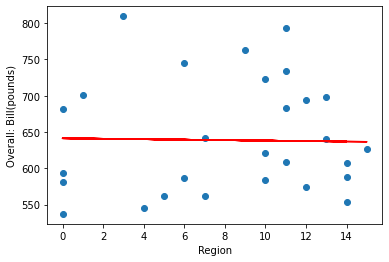

In [94]:
# plot the data and the prediction line
%matplotlib inline
plt.scatter(X_test, y_test)
plt.plot(X_test, ridge_pred4, color='red')
plt.xlabel('Region')
plt.ylabel('Overall: Bill(pounds)')
plt.show()

*Ridge Regression Conclusion:* Ridge Regression is not an appropriate model for predicting UK household energy prices due to model underfitting and high root-mean-square error values. 

**Ridge Regression with Repeated K-Fold Cross Validation**

In [95]:
# Overall Unit Cost vs Year

# Define model evaluation method with 4 fold cross-validation
cv = RepeatedKFold(n_splits=4, n_repeats=3, random_state=1) 

# Defining the model with 3 alphas of 0, 1, and 0.01 (λ), one for each n_repeat
RidgeCV_model1 = RidgeCV(alphas=arange(0, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error') 

# Fitting the model
RidgeCV_model1.fit(X1, y1) 

# Summarise chosen configuration
print('alpha: %f' % RidgeCV_model1.alpha_) # λ = 0.0000

alpha: 0.000000


In [96]:
# Overall Unit Cost vs Region

# Define model evaluation method with 4 fold cross-validation
cv = RepeatedKFold(n_splits=4, n_repeats=3, random_state=1) 

# Defining the model with 3 alphas of 0, 1, and 0.01 (λ), one for each n_repeat
RidgeCV_model2 = RidgeCV(alphas=arange(0, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error') 

# Fitting the model
RidgeCV_model2.fit(X2, y1) 

# Summarise chosen configuration
print('alpha: %f' % RidgeCV_model2.alpha_) # λ = 0.99

alpha: 0.990000


In [97]:
# Overall Bill vs Year

# Define model evaluation method with 4 fold cross-validation
cv = RepeatedKFold(n_splits=4, n_repeats=3, random_state=1) 

# Defining the model with 3 alphas of 0, 1, and 0.01 (λ), one for each n_repeat
RidgeCV_model3 = RidgeCV(alphas=arange(0, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error') 

# Fitting the model
RidgeCV_model3.fit(X1, y2) 

# Summarise chosen configuration
print('alpha: %f' % RidgeCV_model3.alpha_) # λ = 0.00

alpha: 0.000000


In [98]:
# Overall Bill vs Region

# Define model evaluation method with 4 fold cross-validation
cv = RepeatedKFold(n_splits=4, n_repeats=3, random_state=1) 

# Defining the model with 3 alphas of 0, 1, and 0.01 (λ), one for each n_repeat
RidgeCV_model4 = RidgeCV(alphas=arange(0, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error') 

# Fitting the model
RidgeCV_model4.fit(X2, y2) 

# Summarise chosen configuration
print('alpha: %f' % RidgeCV_model4.alpha_) # λ = 0.99

alpha: 0.990000


The extreme alpha values from all the RidgeCV models implies poor fitting of the data, RidgeCV is not appropriate for making predictions from the data at this stage.

**Estimators with built-in Cross Validation using yellowbrick**

The AlphaSelection visualizer wraps a “RegressionCV” model and visualizes the alpha/error curve. Use this visualization to detect if the model is responding to regularization, e.g. as you increase or decrease alpha, the model responds and error is decreased. If the visualization shows a jagged or random plot, then potentially the model is not sensitive to that type of regularization and another is required (e.g. L1 or Lasso regularization).

source: https://www.scikit-yb.org/en/latest/api/regressor/alphas.html

In [123]:
from sklearn.linear_model import LassoCV
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import AlphaSelection
from yellowbrick.regressor.alphas import alphas

*Unit Cost vs Year*

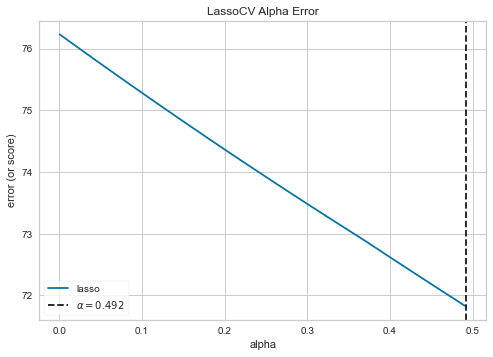

AlphaSelection(ax=<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>,
               estimator=LassoCV(random_state=5))

In [103]:
# Use yellowbrick quick method to immediately show model of Unit Cost vs Year

alphas(LassoCV(random_state=5), X1, y1.ravel())

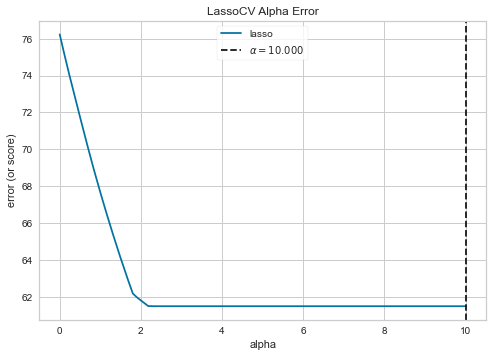

<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>

In [109]:
# Create a list of alphas to cross-validate against
alphas = np.logspace(-10, 1, 400)

# Instantiate the linear model and visualizer

model = LassoCV(alphas=alphas)
visualizer = AlphaSelection(model)
visualizer.fit(X1, y1.ravel())
visualizer.show()

For Unit Cost vs Year, it appears regularisation would result in some error reduction (but not enough to get error closer to zero). As alpha increases, error decreases.

*Unit Cost vs Region*

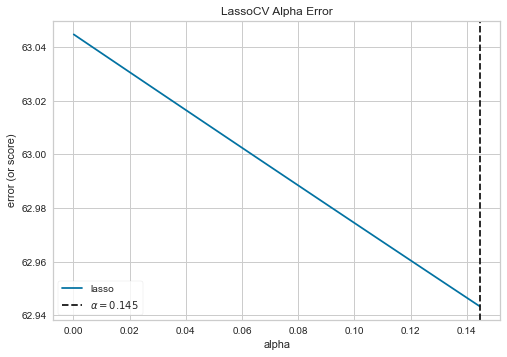

AlphaSelection(ax=<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>,
               estimator=LassoCV(random_state=6))

In [104]:
alphas(LassoCV(random_state=6), X2, y1.ravel())

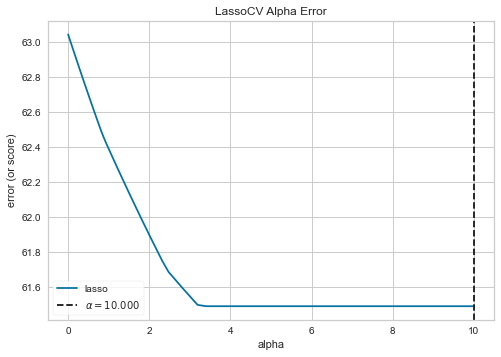

<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>

In [110]:
# Create a list of alphas to cross-validate against
alphas = np.logspace(-10, 1, 400)

# Instantiate the linear model and visualizer

model = LassoCV(alphas=alphas)
visualizer = AlphaSelection(model)
visualizer.fit(X2, y1.ravel())
visualizer.show()

For Unit Cost vs Region, it appears regularisation would result in some minmal error reduction (but not enough to get error closer to zero). As alpha increases (until it reaches 3 where it flatlines), error decreases.

*Bill vs Year*

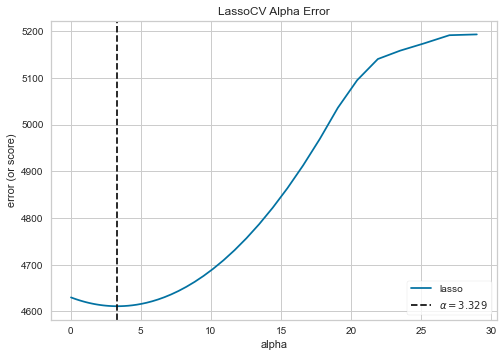

AlphaSelection(ax=<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>,
               estimator=LassoCV(random_state=7))

In [105]:
alphas(LassoCV(random_state=7), X1, y2.ravel())

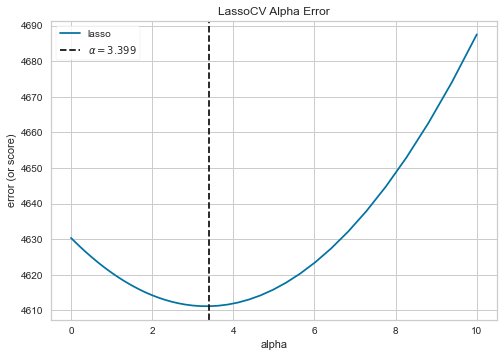

<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>

In [111]:
# Create a list of alphas to cross-validate against
alphas = np.logspace(-10, 1, 400)

# Instantiate the linear model and visualizer

model = LassoCV(alphas=alphas)
visualizer = AlphaSelection(model)
visualizer.fit(X1, y2.ravel())
visualizer.show()

For Bill vs Year, it appears regularisation would result in some error reduction, an alpha of 3.399 is optimal for error reduction. The error still scores very high though (in the region of 4600s).

*Bill vs Region*

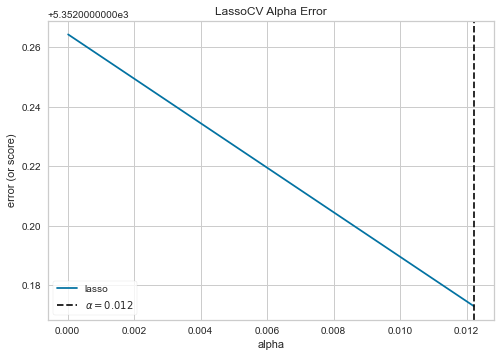

AlphaSelection(ax=<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>,
               estimator=LassoCV(random_state=10))

In [124]:
alphas(LassoCV(random_state=10), X2, y2.ravel())

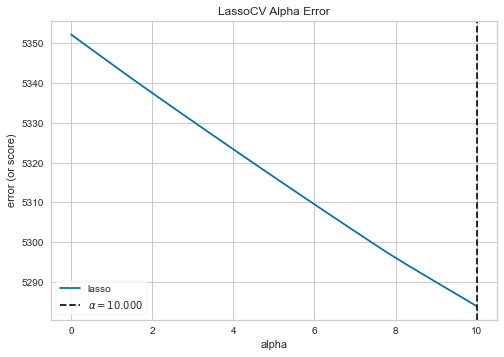

<AxesSubplot:title={'center':'LassoCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>

In [125]:
# Create a list of alphas to cross-validate against
alphas = np.logspace(-10, 1, 400)

# Instantiate the linear model and visualizer

model = LassoCV(alphas=alphas)
visualizer = AlphaSelection(model)
visualizer.fit(X2, y2.ravel())
visualizer.show()

For Bill vs Region, it appears regularisation would result in some error reduction, the error still scores very high though (in the region of 5300s).

**Lasso Models with more optimal alpha values**

In [150]:
# train test split of overall unit cost vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=73)

In [151]:
# unit cost vs year

# define model
lasso_mod1 = Lasso(alpha=0.492)

# fit model
lasso_mod1.fit(X_train, y_train)

# make prediction
lasso_pred1 = lasso_mod1.predict(X_test)

# Calculate the mean squared error
rmsel1 = mean_squared_error(y_test,lasso_pred1)**0.5 # to power of 0.5 is same as taking square root
print(rmsel1) #rmsel = 7.395452936692769 when alpha is 0.492 which is more error than ridge model (7.377939663787684 when alpha is 0.05)

7.395452936692769


In [152]:
# train test split of overall unit cost vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y1, test_size=0.2, random_state=2)

In [153]:
# unit cost vs region 

# define model
lasso_mod2 = Lasso(alpha=0.145)

# fit model
lasso_mod2.fit(X_train, y_train)

# make prediction
lasso_pred2 = lasso_mod2.predict(X_test)

# Calculate the mean squared error
rmsel2 = mean_squared_error(y_test,lasso_pred2)**0.5
print(rmsel2) #rmsel = 7.608446726185148 when alpha is 0.0145 which is less error than ridge model (7.611233930453675 when alpha is 0.05)

7.608446726185148


In [154]:
# train test split of overall bill vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y2, test_size=0.2, random_state=9)

In [155]:
# bill vs year

# define model
lasso_mod3 = Lasso(alpha=3.399)

# fit model
lasso_mod3.fit(X_train, y_train)

# make prediction
lasso_pred3 = lasso_mod3.predict(X_test)

# Calculate the mean squared error
rmsel3 = mean_squared_error(y_test,lasso_pred3)**0.5
print(rmsel3) #rmsel = 64.88798052905588 when alpha is 3.399 which is more than ridge model (64.84354696916513 when alpha is 0.05)

64.88798052905588


In [156]:
# train test split of overall bill vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=84)

In [157]:
# bill vs region

# define model
lasso_mod4 = Lasso(alpha=0.012)

# fit model
lasso_mod4.fit(X_train, y_train)

# make prediction
lasso_pred4 = lasso_mod4.predict(X_test)

# Calculate the mean squared error
rmsel4 = mean_squared_error(y_test,lasso_pred4)**0.5
print(rmsel4) #rmsel = 77.78829277661478 when alpha is 0.012 which is less than ridge model (77.78852026755071 when alpha is 0.05)

77.78829277661478


'Unit Cost vs Region' and 'Bill vs Region' saw best error reduction by using Lasso CV with more "optimised" alpha values. Lasso CV does not appear to be an appropriate model for the data however as the error values were generally increased with this model.

## K-Nearest Neighbour with GridSearchCV

Using K-Nearest Neighbour, we predict the category of the test point from the available class labels by finding the distance between the test point and trained k nearest feature values. To find the best value for k, use a tool called GridSearchCV. This is a tool that is often used for tuning hyperparameters of machine learning models. In your case, it will help by automatically finding the best value of k for your dataset. 

source: https://towardsdatascience.com/how-to-find-the-optimal-value-of-k-in-knn-35d936e554eb  

source: https://realpython.com/knn-python/

In [158]:
from sklearn.model_selection import GridSearchCV

*unit cost vs year*

In [172]:
# train test split of overall unit cost vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=73)

In [165]:
# finding a good n_neighbours value

parameters = {"n_neighbors": range(1, 50)}
gridsearch1 = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch1.fit(X_train, y_train)
GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

In [166]:
gridsearch1.best_params_ # 23 n_neighbours

{'n_neighbors': 23}

In [173]:
# define model with recommended n_neighbours

knnr1 = KNeighborsRegressor(n_neighbors=23)

# fit model
knnr1.fit(X_train,y_train)

# make prediction
knn_pred1 = knnr1.predict(X_test)

# Calculate the mean squared error
rmsek1 = mean_squared_error(y_test,knn_pred1)**0.5
print(rmsek1) #rmsek = 7.424229952148795 when n_neighbours is 23

7.424229952148795


*unit cost vs region*

In [174]:
# train test split of overall unit cost vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y1, test_size=0.2, random_state=2)

In [175]:
# finding a good n_neighbours value

parameters = {"n_neighbors": range(1, 50)}
gridsearch2 = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch2.fit(X_train, y_train)
GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

In [176]:
gridsearch2.best_params_

{'n_neighbors': 45}

In [178]:
# define model with recommended n_neighbours

knnr2 = KNeighborsRegressor(n_neighbors=45)

# fit model
knnr2.fit(X_train,y_train)

# make prediction
knn_pred2 = knnr2.predict(X_test)

# Calculate the mean squared error
rmsek2 = mean_squared_error(y_test,knn_pred2)**0.5
print(rmsek2) #rmsek = 7.622820113811535 when n_neighbours is 45

7.622820113811535


*bill vs year*

In [179]:
# train test split of overall bill vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y2, test_size=0.2, random_state=9)

In [180]:
parameters = {"n_neighbors": range(1, 50)}
gridsearch3 = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch3.fit(X_train, y_train)
GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

In [181]:
gridsearch3.best_params_

{'n_neighbors': 28}

In [182]:
# define model with recommended n_neighbours

knnr3 = KNeighborsRegressor(n_neighbors=28)

# fit model
knnr3.fit(X_train,y_train)

# make prediction
knn_pred3 = knnr3.predict(X_test)

# Calculate the mean squared error
rmsek3 = mean_squared_error(y_test,knn_pred3)**0.5
print(rmsek3) #rmsek = 63.996138628174315 when n_neighbours is 28

63.996138628174315


In [183]:
# train test split of overall bill vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=84)

In [184]:
# finding a good n_neighbours value

parameters = {"n_neighbors": range(1, 50)}
gridsearch4 = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch4.fit(X_train, y_train)
GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50),
                         'weights': ['uniform', 'distance']})

In [185]:
gridsearch4.best_params_

{'n_neighbors': 42}

In [186]:
# define model with recommended n_neighbours

knnr4 = KNeighborsRegressor(n_neighbors=42)

# fit model
knnr4.fit(X_train,y_train)

# make prediction
knn_pred4 = knnr4.predict(X_test)

# Calculate the mean squared error
rmsek4 = mean_squared_error(y_test,knn_pred4)**0.5
print(rmsek4) #rmsek = 77.4961412950683 when n_neighbours is 42

77.4961412950683


## Linear Accuracy Metrics

Below is a table comparing the root mean square error for each model. The lowest rmse scores are **highlighted**  

|                        | Unit Cost vs Year | Unit Cost vs Region | Bill vs Year     | Bill vs Region   |
|------------------------|-------------------|---------------------|------------------|------------------|
| Ridge                  |**7.377939663787684**  |7.611233930453675    |**64.84354696916513** |77.78852026755071 |
| Lasso CV               |7.395452936692769  |**7.608446726185148**    |64.88798052905588 |77.78829277661478 |
| KNN with GridSearchCV  |7.424229952148795  |7.622820113811535    |63.996138628174315|**77.4961412950683**  |

**Takeaway:** The implication is that linear models are not appropriate for predicting UK household electricity prices because the data does not appear to form or follow any linear trends. A non-linear model will be required to assess the relationship between bill and unit cost against year and region. 

## Support Vector

In [207]:
from sklearn.svm import SVC
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from yellowbrick.model_selection import ValidationCurve

*unit cost vs year*

In [205]:
# train test split of overall unit cost vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y1.ravel(), test_size=0.2, random_state=73)

In [206]:
# define model
sc1 = StandardScaler()
sc2 = StandardScaler()

x1 = X_train.copy()
x2 = X_test.copy()

# fit model 
x1 = sc1.fit_transform(x1)
x2 = sc2.fit_transform(x2)
svr1=SVR()
svr1.fit(x1,y_train)

# make prediction
svr_pred1 = svr1.predict(x2)

# Calculate the mean squared error
rmsesv1 = mean_squared_error(y_test,svr_pred1)**0.5
print(rmsesv1) #rmsesv = 9.385710947057879

9.385710947057879


*unit cost vs region*

In [195]:
# train test split of overall unit cost vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y1.ravel(), test_size=0.2, random_state=2)

In [196]:
# define model
sc1 = StandardScaler()
sc2 = StandardScaler()

x1 = X_train.copy()
x2 = X_test.copy()

# fit model 
x1 = sc1.fit_transform(x1)
x2 = sc2.fit_transform(x2)
svr2=SVR()
svr2.fit(x1,y_train)

# make prediction
svr_pred2 = svr2.predict(x2)

# Calculate the mean squared error
rmsesv2 = mean_squared_error(y_test,svr_pred2)**0.5
print(rmsesv2) #rmsesv = 8.530631936735448

8.530631936735448


*bill vs year*

In [197]:
# train test split of overall bill vs year
X_train, X_test, y_train, y_test = train_test_split(X1, y2.ravel(), test_size=0.2, random_state=9)

In [198]:
# define model
sc1 = StandardScaler()
sc2 = StandardScaler()

x1 = X_train.copy()
x2 = X_test.copy()

# fit model 
x1 = sc1.fit_transform(x1)
x2 = sc2.fit_transform(x2)
svr3=SVR()
svr3.fit(x1,y_train)

# make prediction
svr_pred3 = svr3.predict(x2)

# Calculate the mean squared error
rmsesv3 = mean_squared_error(y_test,svr_pred3)**0.5
print(rmsesv3) #rmsesv = 65.6698296948973

65.6698296948973


*bill vs region*

In [199]:
# train test split of overall bill vs region
X_train, X_test, y_train, y_test = train_test_split(X2, y2.ravel(), test_size=0.2, random_state=84)

In [200]:
# define model
sc1 = StandardScaler()
sc2 = StandardScaler()

x1 = X_train.copy()
x2 = X_test.copy()

# fit model 
x1 = sc1.fit_transform(x1)
x2 = sc2.fit_transform(x2)
svr4=SVR()
svr4.fit(x1,y_train)

# make prediction
svr_pred4 = svr4.predict(x2)

# Calculate the mean squared error
rmsesv4 = mean_squared_error(y_test,svr_pred4)**0.5
print(rmsesv4) #rmsesv = 80.89183348569472

80.89183348569472


## XGBoost

## LightGBM

## LightGBM

# lgbm = LGBMRegressor()

# lgbm.fit(X_train,y_train)

# lgbm_pred = lgbm.predict(X_test)

# # Calculate the mean squared error
# rmselgbm = mean_squared_error(y_test,lgbm_pred)**0.5
# print(rmselgbm) #rmselgbm = ?

## Random Forest

In [ ]:
# define model
rf_mod = RandomForestRegressor()

# fit model
rf_mod.fit(X_train,y_train)

#make prediction
rf_pred = rf_mod.predict(X_test)

# Calculate the mean squared error
rmserf = mean_squared_error(y_test,rf_pred)**0.5
print(rmserf) #rmserf = 5.664840253147916

## Non-Linear Accuracy Metrics

|Model Type|                        | Unit Cost vs Year | Unit Cost vs Region | Bill vs Year     | Bill vs Region   |
|----------|------------------------|-------------------|---------------------|------------------|------------------|
|Linear    | Ridge                  |7.377939663787684  |7.611233930453675    |64.84354696916513 |77.78852026755071 |
|Linear    | Lasso CV               |7.395452936692769  |7.608446726185148    |64.88798052905588 |77.78829277661478 |
|Linear    | KNN with GridSearchCV  |7.424229952148795  |7.622820113811535    |63.996138628174315|77.4961412950683  |
|Non-Linear| Support Vector         |9.385710947057879  |8.530631936735448    |65.6698296948973  |80.89183348569472 |
|Non Linear| XGBoost                |  |    | | |
|Non-Linear| LightGBM               |  |    ||  |
|Non-Linear| RandomForest           |  |    ||  |